# Exercise1: Normalized Laplacians: Properties and Key Details

The normalized Laplacians $L_{\text{sym}}$ and $L_{\text{rw}}$ have several important properties that make them useful for graph analysis and spectral methods. Below is a detailed breakdown of their key properties:

## 1. Symmetric Normalized Laplacian ($L_{\text{sym}} = D^{-\frac{1}{2}} L D^{-\frac{1}{2}}$)

### Key Properties:
- **Symmetry**:  
  $L_{\text{sym}}$ is symmetric, meaning $L_{\text{sym}} = L_{\text{sym}}^\top$. This property makes it well-suited for eigenvalue decomposition and spectral clustering tasks.

- **Positive Semi-Definiteness**:  
  All eigenvalues of $L_{\text{sym}}$ are non-negative ($\lambda_i \geq 0$), similar to the unnormalized Laplacian.

- **Smallest Eigenvalue**:  
  The smallest eigenvalue of $L_{\text{sym}}$ is always $0$, representing the trivial eigenvector associated with the constant function over the graph.

- **Clustering and Balance**:  
  Normalization ensures that $L_{\text{sym}}$ balances the influence of nodes with different degrees, avoiding biases toward high-degree nodes. Eigenvectors of $L_{\text{sym}}$ can be used for balanced graph partitioning in spectral clustering.

- **Spectrum (Eigenvalues)**:  
  - The number of eigenvalues equal to $0$ corresponds to the number of connected components in the graph.  
  - For a connected graph, there is exactly one $0$-eigenvalue.

- **Row and Column Sums**:  
  The rows and columns of $L_{\text{sym}}$ do not sum to $0$, unlike the random walk Laplacian. Instead, the normalization ensures proper scaling based on node degrees.

---

## 2. Random Walk Laplacian ($L_{\text{rw}} = D^{-1} L$)

### Key Properties:
- **Asymmetry**:  
  $L_{\text{rw}}$ is generally not symmetric. This reflects its connection to random walk dynamics, which are inherently directional processes.

- **Positive Semi-Definiteness**:  
  Like $L_{\text{sym}}$, all eigenvalues of $L_{\text{rw}}$ are non-negative ($\lambda_i \geq 0$).

- **Smallest Eigenvalue**:  
  The smallest eigenvalue of $L_{\text{rw}}$ is $0$, corresponding to the constant eigenvector.

- **Interpretation as a Markov Process**:  
  $L_{\text{rw}}$ relates closely to the transition matrix of a random walk on the graph:
  $$
  P = D^{-1}A \quad \text{(random walk transition matrix)}, \quad L_{\text{rw}} = I - P
  $$  
  This means $L_{\text{rw}}$ models deviations from the stationary distribution of a random walk.

- **Row Sums**:  
  Each row of $L_{\text{rw}}$ sums to $0$. This reflects the conservation property of the random walk probabilities.

- **Clustering**:  
  The eigenvectors of $L_{\text{rw}}$ can be used for spectral clustering, especially when modeling diffusion-like processes in the graph.

---

## 3. Shared Properties of $L_{\text{sym}}$ and $L_{\text{rw}}$
- **Non-Negative Eigenvalues**:  
  Both normalized Laplacians are positive semi-definite, ensuring non-negative eigenvalues.

- **Connected Components**:  
  For both $L_{\text{sym}}$ and $L_{\text{rw}}$, the number of $0$-eigenvalues indicates the number of connected components in the graph.

- **Normalization**:  
  Both Laplacians adjust for the degree of nodes, ensuring that the influence of high-degree nodes is normalized.

- **Applications**:  
  Both $L_{\text{sym}}$ and $L_{\text{rw}}$ are widely used in spectral clustering, graph signal processing, and random walk modeling.

---

## 4. Comparison Between $L_{\text{sym}}$ and $L_{\text{rw}}$

| **Property** | **$L_{\text{sym}}$** | **$L_{\text{rw}}$** |
|--------------|---------------------|-------------------|
| **Symmetry** | Symmetric | Not symmetric |
| **Row Sums** | Rows do not sum to 0 | Rows sum to 0 |
| **Clustering Focus** | Balanced clusters | Diffusion-like clusters |
| **Spectral Clustering** | Well-suited for eigenvalue decomposition | Used for Markov processes or random walks |
| **Normalization Type** | Symmetric normalization | Row normalization |


# Exercise 2:

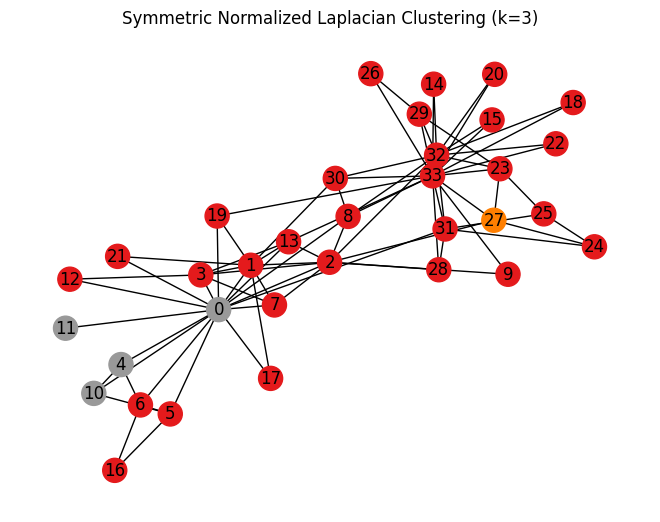

In [29]:
import networkx as nx
import numpy as np
from scipy.sparse.linalg import eigsh
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, adjusted_rand_score, normalized_mutual_info_score
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Create a graph
G = nx.karate_club_graph()  # Example graph (Karate Club)

# Step 2: Compute different Laplacians
# Degree matrix
degrees = np.diag([d for _, d in G.degree()])
adjacency = nx.to_numpy_array(G)

# Unnormalized Laplacian
L = degrees - adjacency

# Symmetric normalized Laplacian
D_sqrt_inv = np.linalg.inv(np.sqrt(degrees))
L_sym = D_sqrt_inv @ L @ D_sqrt_inv

# Random walk Laplacian
D_inv = np.linalg.inv(degrees)
L_rw = D_inv @ L

# Step 3: Compute the k smallest eigenvectors for each Laplacian
def compute_eigenvectors(L, k):
    eigvals, eigvecs = eigsh(L, k=k, which='SM')  # Smallest k eigenvalues
    return eigvecs

k_values = [2, 3, 4, 5]  # Different numbers of clusters to test
results = []

for k in k_values:
    eigvecs_unnormalized = compute_eigenvectors(L, k)
    eigvecs_sym = compute_eigenvectors(L_sym, k)
    eigvecs_rw = compute_eigenvectors(L_rw, k)

    # Step 4: Apply k-means clustering
    def apply_kmeans(eigvecs, k):
        kmeans = KMeans(n_clusters=k, random_state=0).fit(eigvecs)
        return kmeans.labels_

    labels_unnormalized = apply_kmeans(eigvecs_unnormalized, k)
    labels_sym = apply_kmeans(eigvecs_sym, k)
    labels_rw = apply_kmeans(eigvecs_rw, k)

    # Step 5: Evaluate clustering
    def evaluate_clustering(labels, adjacency):
        # Compute silhouette score (higher is better)
        return silhouette_score(adjacency, labels, metric='euclidean')

    silhouette_unnormalized = evaluate_clustering(labels_unnormalized, adjacency)
    silhouette_sym = evaluate_clustering(labels_sym, adjacency)
    silhouette_rw = evaluate_clustering(labels_rw, adjacency)

    # Collect results for each k and Laplacian type
    results.append({
        "k": k,
        "Laplacian": "Unnormalized",
        "Silhouette Score": silhouette_unnormalized
    })
    results.append({
        "k": k,
        "Laplacian": "Symmetric Normalized",
        "Silhouette Score": silhouette_sym
    })
    results.append({
        "k": k,
        "Laplacian": "Random Walk",
        "Silhouette Score": silhouette_rw
    })

# Convert results to a DataFrame for better visualization
results_df = pd.DataFrame(results)


# Visualize clustering for a specific k and Laplacian type
def visualize_clustering(G, labels, title):
    pos = nx.spring_layout(G)  # Layout for graph visualization
    nx.draw(G, pos, node_color=labels, with_labels=True, cmap=plt.cm.Set1)
    plt.title(title)
    plt.show()

# Example visualization for k=3
k_to_visualize = 3
eigvecs_sym_to_visualize = compute_eigenvectors(L_sym, k_to_visualize)
labels_sym_to_visualize = apply_kmeans(eigvecs_sym_to_visualize, k_to_visualize)
visualize_clustering(G, labels_sym_to_visualize, f"Symmetric Normalized Laplacian Clustering (k={k_to_visualize})")


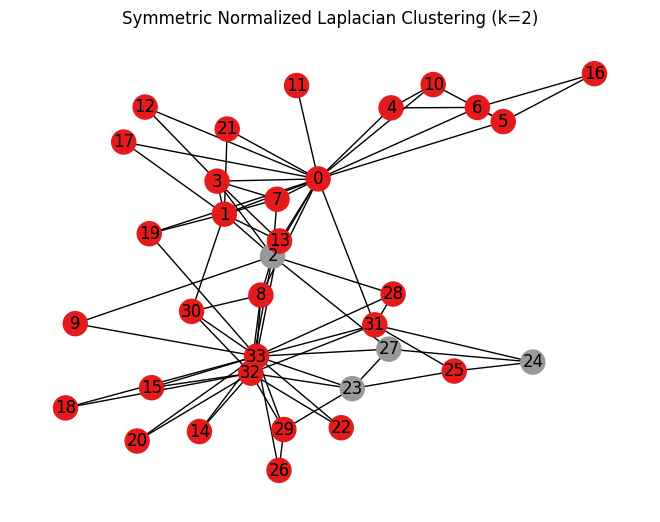

In [4]:
# Example visualization for k=3
k_to_visualize = 2
eigvecs_sym_to_visualize = compute_eigenvectors(L_sym, k_to_visualize)
labels_sym_to_visualize = apply_kmeans(eigvecs_sym_to_visualize, k_to_visualize)
visualize_clustering(G, labels_sym_to_visualize, f"Symmetric Normalized Laplacian Clustering (k={k_to_visualize})")


In [24]:
# Modify the Laplacian computation to handle singular matrices
def test_spectral_clustering_on_graph_fixed(graph, graph_name, k_values):
    # Remove isolated nodes to avoid singular degree matrices
    graph = graph.copy()
    graph.remove_nodes_from(list(nx.isolates(graph)))

    # Adjacency matrix and degree matrix
    adjacency = nx.to_numpy_array(graph)
    degrees = np.diag([d for _, d in graph.degree()])

    # Compute Laplacians
    L = degrees - adjacency  # Unnormalized Laplacian
    with np.errstate(divide='ignore', invalid='ignore'):  # Ignore warnings for division by zero
        D_sqrt_inv = np.linalg.pinv(np.sqrt(degrees))  # Use pseudo-inverse to handle singular matrices
        L_sym = D_sqrt_inv @ L @ D_sqrt_inv  # Symmetric normalized Laplacian
        D_inv = np.linalg.pinv(degrees)
        L_rw = D_inv @ L  # Random walk Laplacian

    results = []

    for k in k_values:
        # Compute eigenvectors
        eigvecs_unnormalized = compute_eigenvectors(L, k)
        eigvecs_sym = compute_eigenvectors(L_sym, k)
        eigvecs_rw = compute_eigenvectors(L_rw, k)

        # Apply k-means clustering
        labels_unnormalized = apply_kmeans(eigvecs_unnormalized, k)
        labels_sym = apply_kmeans(eigvecs_sym, k)
        labels_rw = apply_kmeans(eigvecs_rw, k)

        # Evaluate clustering
        silhouette_unnormalized = evaluate_clustering(labels_unnormalized, adjacency)
        silhouette_sym = evaluate_clustering(labels_sym, adjacency)
        silhouette_rw = evaluate_clustering(labels_rw, adjacency)

        # Store results
        results.append({
            "Graph": graph_name,
            "k": k,
            "Laplacian": "Unnormalized",
            "Silhouette Score": silhouette_unnormalized
        })
        results.append({
            "Graph": graph_name,
            "k": k,
            "Laplacian": "Symmetric Normalized",
            "Silhouette Score": silhouette_sym
        })
        results.append({
            "Graph": graph_name,
            "k": k,
            "Laplacian": "Random Walk",
            "Silhouette Score": silhouette_rw
        })

    return results

# Run spectral clustering tests on each graph with fixed Laplacian computation
all_results_fixed = []

graphs = {
    "Karate Club": nx.karate_club_graph(),
    "Erdős-Rényi": nx.erdos_renyi_graph(34, 0.1),  # Random graph
    "Erdős-Rényi_Dense_Graph": nx.erdos_renyi_graph(50, 0.8),  # Dense graph
    "Erdős-Rényi_Sparse_Graph": nx.erdos_renyi_graph(50, 0.1),  # Sparse graph
    "Barabási-Albert": nx.barabasi_albert_graph(34, 2)  # Scale-free graph
}

for graph_name, graph in graphs.items():
    results = test_spectral_clustering_on_graph_fixed(graph, graph_name, k_values)
    all_results_fixed.extend(results)

# Convert results to a DataFrame for better visualization
all_results_fixed_df = pd.DataFrame(all_results_fixed)



In [27]:
print(all_results_fixed_df)


                       Graph  k             Laplacian  Silhouette Score
0                Karate Club  2          Unnormalized          0.051609
1                Karate Club  2  Symmetric Normalized          0.122548
2                Karate Club  2           Random Walk         -0.007060
3                Karate Club  3          Unnormalized         -0.253062
4                Karate Club  3  Symmetric Normalized         -0.062811
5                Karate Club  3           Random Walk         -0.139083
6                Karate Club  4          Unnormalized         -0.263564
7                Karate Club  4  Symmetric Normalized         -0.117984
8                Karate Club  4           Random Walk         -0.050247
9                Karate Club  5          Unnormalized         -0.264034
10               Karate Club  5  Symmetric Normalized         -0.141516
11               Karate Club  5           Random Walk         -0.251549
12               Erdős-Rényi  2          Unnormalized         -0

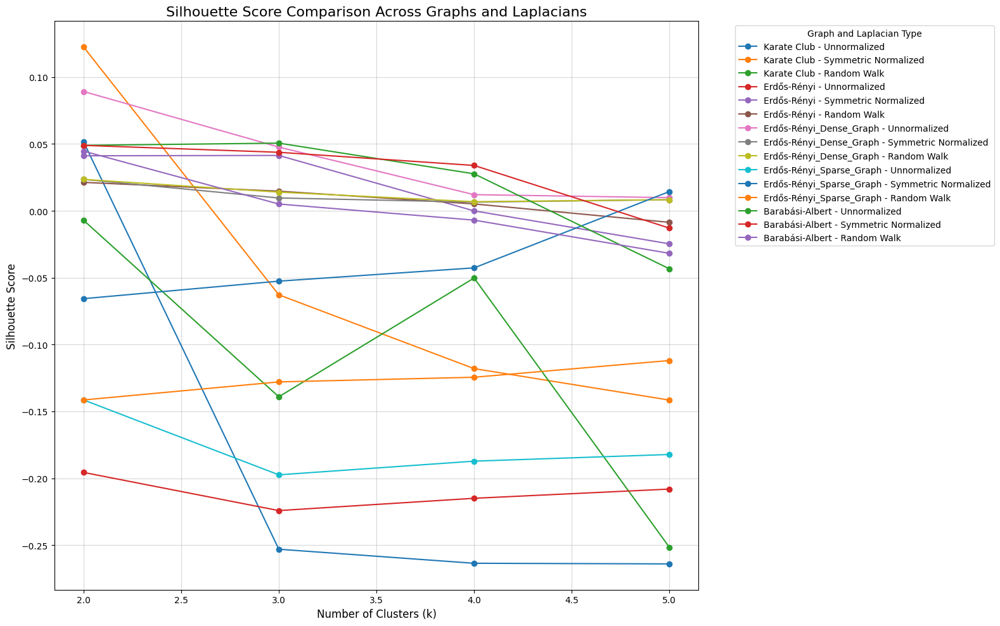

In [33]:
plt.figure(figsize=(16, 10))

# Iterate over each graph type and create a subplot
graphs = all_results_fixed_df["Graph"].unique()
for graph in graphs:
    graph_data = all_results_fixed_df[all_results_fixed_df["Graph"] == graph]
    for laplacian in graph_data["Laplacian"].unique():
        subset = graph_data[graph_data["Laplacian"] == laplacian]
        plt.plot(
            subset["k"],
            subset["Silhouette Score"],
            marker='o',
            label=f"{graph} - {laplacian}"
        )

plt.title("Silhouette Score Comparison Across Graphs and Laplacians", fontsize=16)
plt.xlabel("Number of Clusters (k)", fontsize=12)
plt.ylabel("Silhouette Score", fontsize=12)
plt.legend(title="Graph and Laplacian Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.5)
plt.tight_layout()
plt.show()

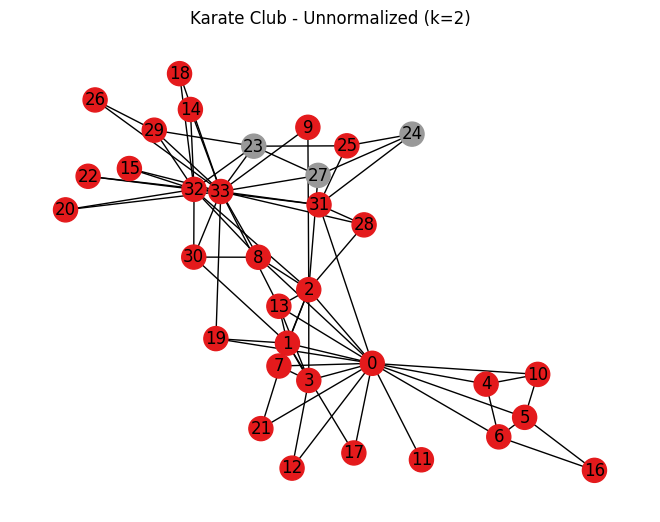

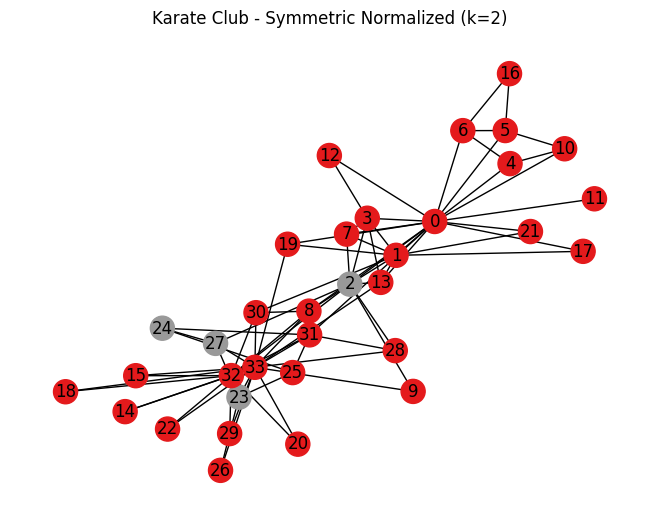

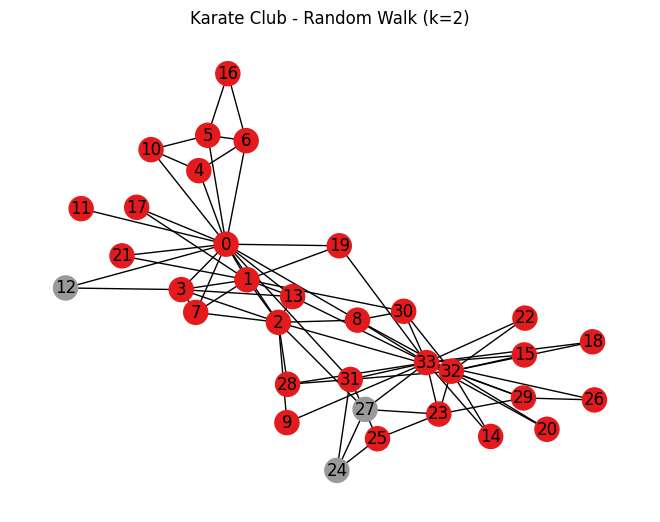

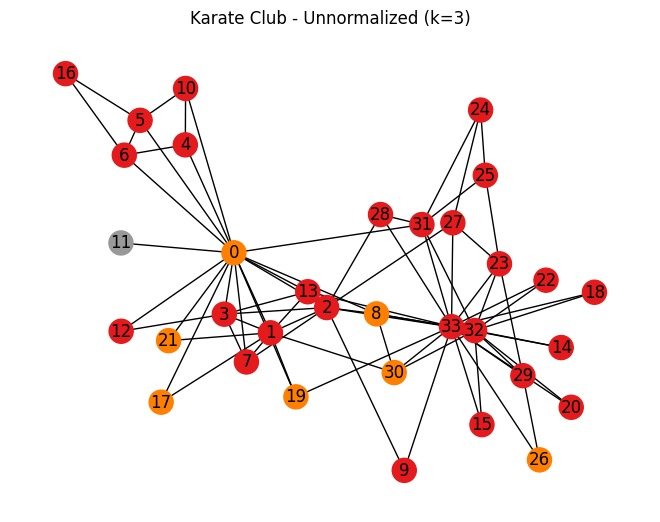

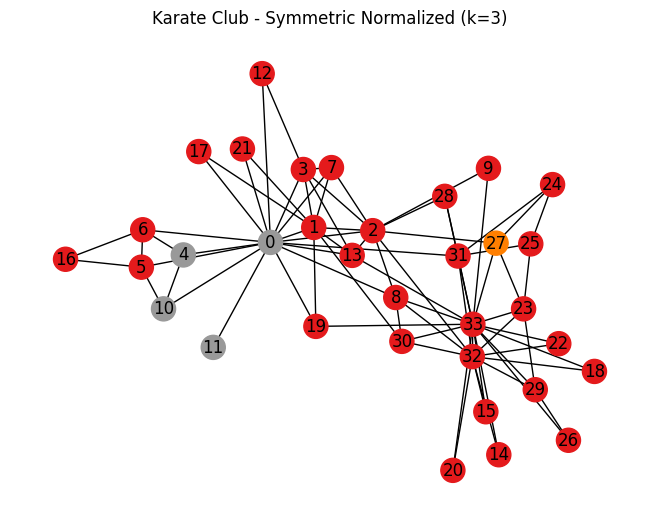

...

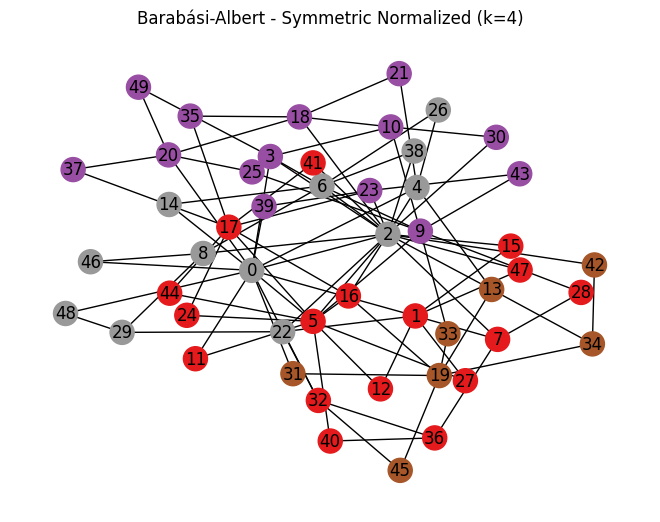

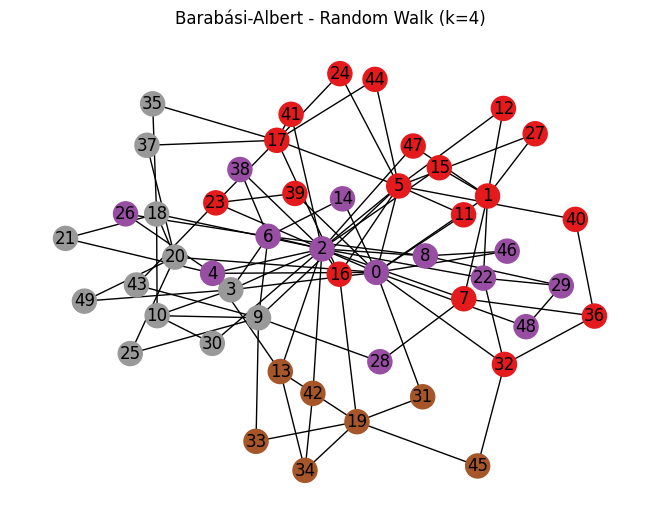

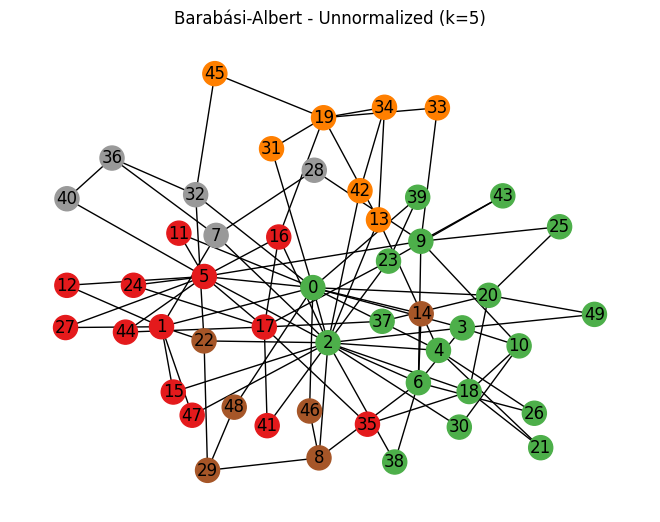

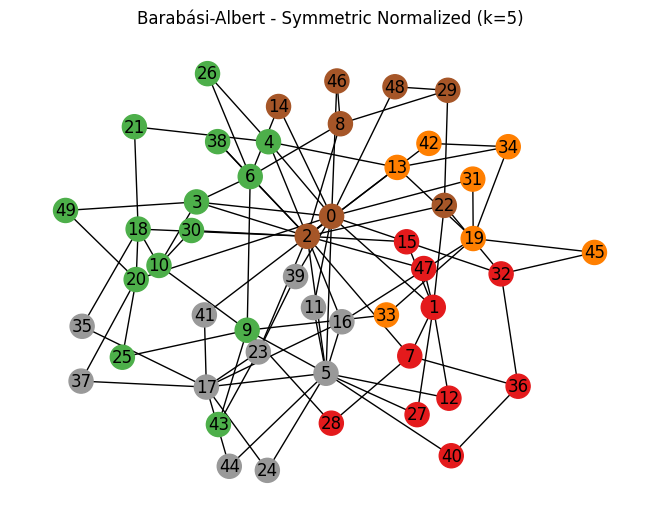

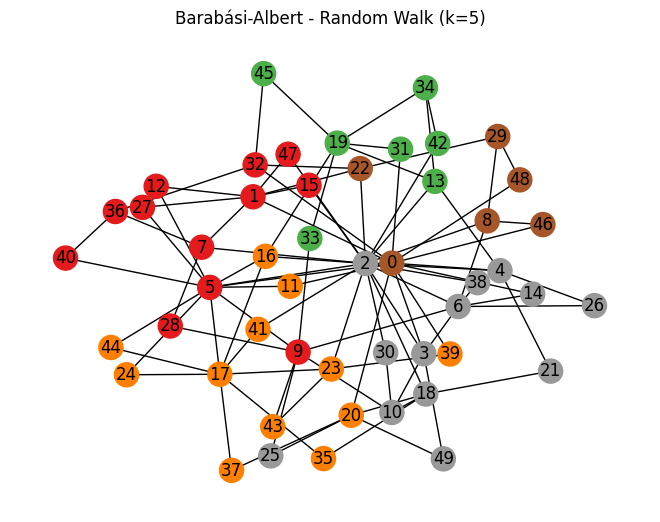

In [28]:
# Visualize clustering for a specific k and Laplacian type
# Function to visualize clustering for all rows in the given DataFrame
def visualize_all_clusters(dataframe, graphs_dict):
    for _, row in dataframe.iterrows():
        graph_name = row['Graph']
        k = row['k']
        laplacian = row['Laplacian']

        # Retrieve the graph from the dictionary
        if graph_name in graphs_dict:
            G = graphs_dict[graph_name]
        else:
            continue

        # Compute Laplacians and eigenvectors for the graph
        adjacency = nx.to_numpy_array(G)
        degrees = np.diag([d for _, d in G.degree()])
        L = degrees - adjacency  # Unnormalized Laplacian
        D_sqrt_inv = np.linalg.pinv(np.sqrt(degrees))
        L_sym = D_sqrt_inv @ L @ D_sqrt_inv  # Symmetric normalized Laplacian
        D_inv = np.linalg.pinv(degrees)
        L_rw = D_inv @ L  # Random walk Laplacian

        if laplacian == "Unnormalized":
            eigvecs = compute_eigenvectors(L, k)
        elif laplacian == "Symmetric Normalized":
            eigvecs = compute_eigenvectors(L_sym, k)
        elif laplacian == "Random Walk":
            eigvecs = compute_eigenvectors(L_rw, k)
        else:
            continue

        # Apply k-means clustering
        labels = apply_kmeans(eigvecs, k)

        # Visualize clustering
        title = f"{graph_name} - {laplacian} (k={k})"
        visualize_clustering(G, labels, title)

# Prepare a dictionary of graphs from the previous tests
graphs_to_visualize = {
    "Karate Club": nx.karate_club_graph(),
    "Erdős-Rényi": nx.erdos_renyi_graph(34, 0.1),
    "Erdős-Rényi_Dense_Graph": nx.erdos_renyi_graph(50, 0.8),
    "Erdős-Rényi_Sparse_Graph": nx.erdos_renyi_graph(50, 0.2),
    "Barabási-Albert": nx.barabasi_albert_graph(50, 2),
}

# Visualize all clusters for the provided DataFrame and graph dictionary
visualize_all_clusters(all_results_fixed_df, graphs_to_visualize)



### Key Aspects of the Data

The table showcases the clustering performance across different types of graphs, Laplacian variants, and cluster numbers (\( k \)). The graphs include the **Karate Club**, a small social network; **Erdős-Rényi**, random graphs with varying densities; and **Barabási-Albert**, graphs generated using preferential attachment, which are scale-free. Erdős-Rényi graphs are further divided into **Dense Graphs** (high edge density) and **Sparse Graphs** (low edge density). The clustering performance is evaluated using the **Silhouette Score**, which measures the quality of clustering. Scores close to 1 indicate well-separated clusters, scores near 0 indicate overlapping clusters, and negative scores represent poor clustering.

### General Observations

For the **Karate Club** graph, the **Symmetric Normalized Laplacian** performs the best for \( k = 2 \) with a Silhouette Score of 0.122548. However, for higher \( k \), the clustering quality declines, particularly for the Unnormalized Laplacian, with negative Silhouette Scores for \( k = 3, 4, \) and \( 5 \). The **Random Walk Laplacian** performs poorly overall for this graph. In **Erdős-Rényi graphs**, Dense Graphs generally have better Silhouette Scores than Sparse Graphs, reflecting the effect of higher connectivity. For Dense Graphs, the **Unnormalized Laplacian** performs better for \( k = 2 \) and \( k = 3 \). Sparse graphs, on the other hand, show consistently lower scores, although the Symmetric Normalized Laplacian occasionally performs slightly better for \( k = 5 \).

The **Barabási-Albert graphs** exhibit the best performance across all graph types, with relatively higher Silhouette Scores. For \( k = 2 \) and \( k = 3 \), all Laplacians yield positive scores, with the Unnormalized Laplacian slightly outperforming others. However, as \( k \) increases, the scores decrease slightly but remain mostly positive.

### Insights

- **Normalized Laplacians**: The **Symmetric Normalized Laplacian** generally performs better for balanced and well-separated clusters, particularly for small \( k \) (e.g., \( k = 2 \)).
- **Random Walk Laplacian**: Tends to perform poorly for most graphs, likely due to its asymmetry.
- **Graph Type**: Dense graphs, such as Barabási-Albert and Dense Erdős-Rényi, are easier to cluster due to their higher connectivity. Sparse graphs, particularly Sparse Erdős-Rényi graphs, consistently show low or negative scores, reflecting poor clustering quality.
- **Impact of \( k \)**: Clustering quality tends to decrease as \( k \) increases, particularly for less structured graphs like Erdős-Rényi.

### Conclusion

The **Symmetric Normalized Laplacian** is the most robust choice for spectral clustering, especially for \( k = 2 \) or \( k = 3 \). Graph characteristics like density and structure significantly affect clustering, with Barabási-Albert graphs performing the best overall. This analysis provides practical insights for selecting the appropriate Laplacian and \( k \) based on graph properties and clustering objectives.


# Exercise 3: Formalization for Approximating the RatioCut for an Arbitrary $k$

To approximate the **RatioCut** for an arbitrary $k$ (where $k$ is the number of clusters), the goal is to partition a graph $G = (V, E)$ into $k$ disjoint subsets ${C_1, C_2, \dots, C_k}$ such that the **RatioCut** metric is minimized. 

## Definition of RatioCut

The **RatioCut** for a $k$-way partition is defined as:
$$
\text{RatioCut}(\{C_1, C_2, \dots, C_k\}) = \sum_{i=1}^k \frac{\text{cut}(C_i, \bar{C}_i)}{|C_i|}
$$


where:
- $\text{cut}(C_i, \bar{C}_i)$ is the sum of the edge weights between $C_i$ and its complement $\bar{C}_i$,
  $$
  \text{cut}(C_i, \bar{C}_i) = \sum_{u \in C_i, v \in \bar{C}_i} w(u, v)
  $$
- $|C_i|$ is the size (cardinality) of the subset $C_i$.

## Formalization of Approximation Using the Normalized Laplacian

To approximate the RatioCut for $k$, we can leverage spectral methods based on the graph Laplacian. The steps are as follows:

### 1. Construct the Laplacian:
Compute the **normalized Laplacian matrix** $L_{\text{sym}} = D^{-\frac{1}{2}} L D^{-\frac{1}{2}}$, where:
- $L = D - A$ is the unnormalized Laplacian
- $D$ is the diagonal degree matrix
- $A$ is the adjacency matrix

### 2. Compute the Eigenvectors:
Find the $k$-smallest eigenvectors $\{v_1, v_2, \dots, v_k\}$ of $L_{\text{sym}}$, corresponding to the $k$-smallest eigenvalues.

### 3. Form the Embedding:
Stack the $k$ eigenvectors to form a matrix $U \in \mathbb{R}^{n \times k}$, where each row represents a node embedded in a $k$-dimensional space.

### 4. Apply Clustering:
Use a standard clustering algorithm, like $k$-means, to partition the rows of $U$ into $k$ clusters.

## Justification of Approximation

- **Spectral Relaxation**:  
  The spectral clustering approach relaxes the discrete partitioning problem into a continuous embedding problem, allowing an efficient solution using eigenvector computations.
  
- The eigenvectors corresponding to the smallest eigenvalues of the normalized Laplacian are directly linked to minimizing the RatioCut objective while maintaining balanced partitions.

This spectral clustering approach provides an effective approximation for the RatioCut objective for arbitrary $k$.


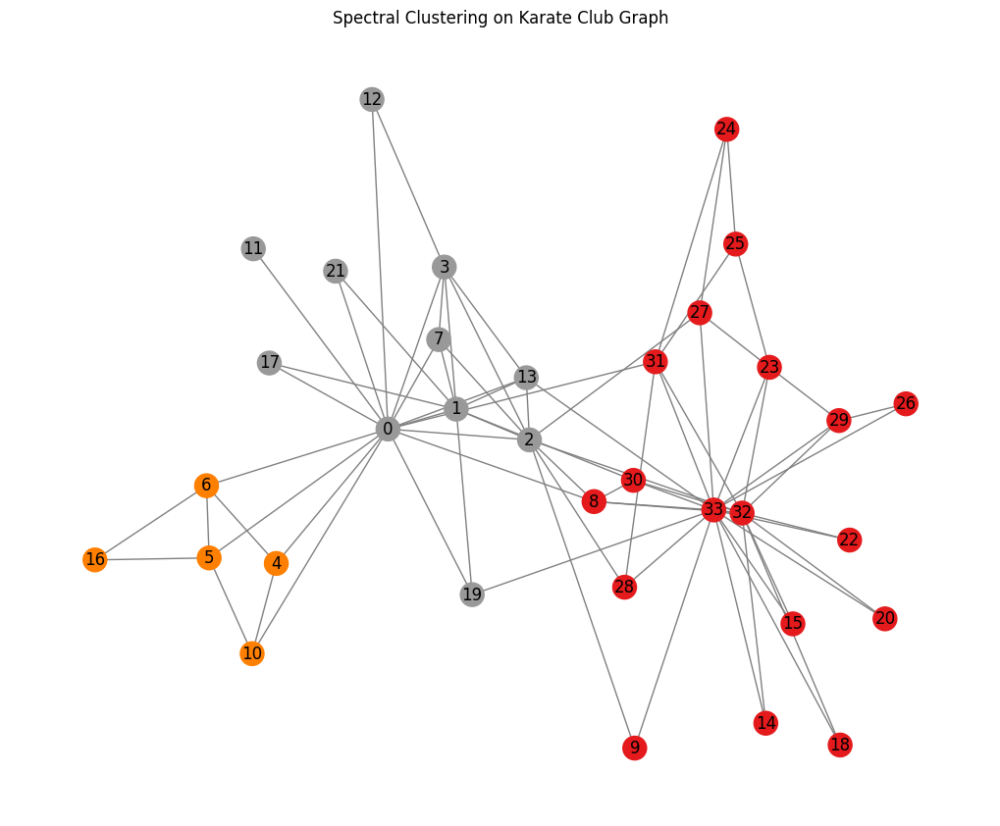

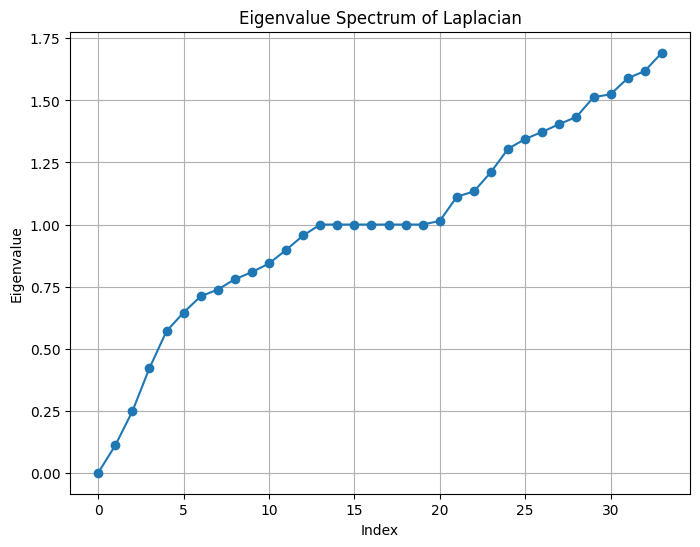

In [34]:
import networkx as nx
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Create a sample graph
G = nx.karate_club_graph()

# Compute the normalized Laplacian matrix
L = nx.normalized_laplacian_matrix(G).toarray()

# Compute the eigenvalues and eigenvectors
eigenvalues, eigenvectors = np.linalg.eigh(L)

# Select the first k eigenvectors for k=3
k = 3
spectral_embedding = eigenvectors[:, :k]

# Apply k-means clustering on the spectral embedding
kmeans = KMeans(n_clusters=k, random_state=0).fit(spectral_embedding)
labels = kmeans.labels_

# Visualize the clusters on the graph
pos = nx.spring_layout(G)
plt.figure(figsize=(10, 8))
nx.draw(
    G, pos, node_color=labels, with_labels=True, cmap=plt.cm.Set1,
    node_size=300, edge_color="gray"
)
plt.title("Spectral Clustering on Karate Club Graph")
plt.show()

# Plot eigenvalue spectrum
plt.figure(figsize=(8, 6))
plt.plot(range(len(eigenvalues)), sorted(eigenvalues), marker='o')
plt.title("Eigenvalue Spectrum of Laplacian")
plt.xlabel("Index")
plt.ylabel("Eigenvalue")
plt.grid()
plt.show()


### 2. Eigenvalue Spectrum of the Laplacian

The second plot shows the eigenvalue spectrum of the normalized Laplacian. The **Index** on the x-axis represents the position of the eigenvalues in ascending order, while the **Eigenvalue** on the y-axis shows the magnitude of each eigenvalue.

#### Key Observations:
- **Smallest Eigenvalue**:  
  The first eigenvalue (index 0) is exactly \( 0 \), which is expected for the normalized Laplacian. It corresponds to the trivial constant eigenvector.

- **Second and Subsequent Eigenvalues**:  
  The second smallest eigenvalue (Fiedler value) is small, suggesting that the graph has good separability into clusters.

- **Gap Analysis**:  
  There is no large gap after the third eigenvalue, which suggests that 3 clusters might be a natural choice for this graph. However, the gap analysis also indicates that additional clusters beyond \( k = 3 \) may not yield meaningful separations.


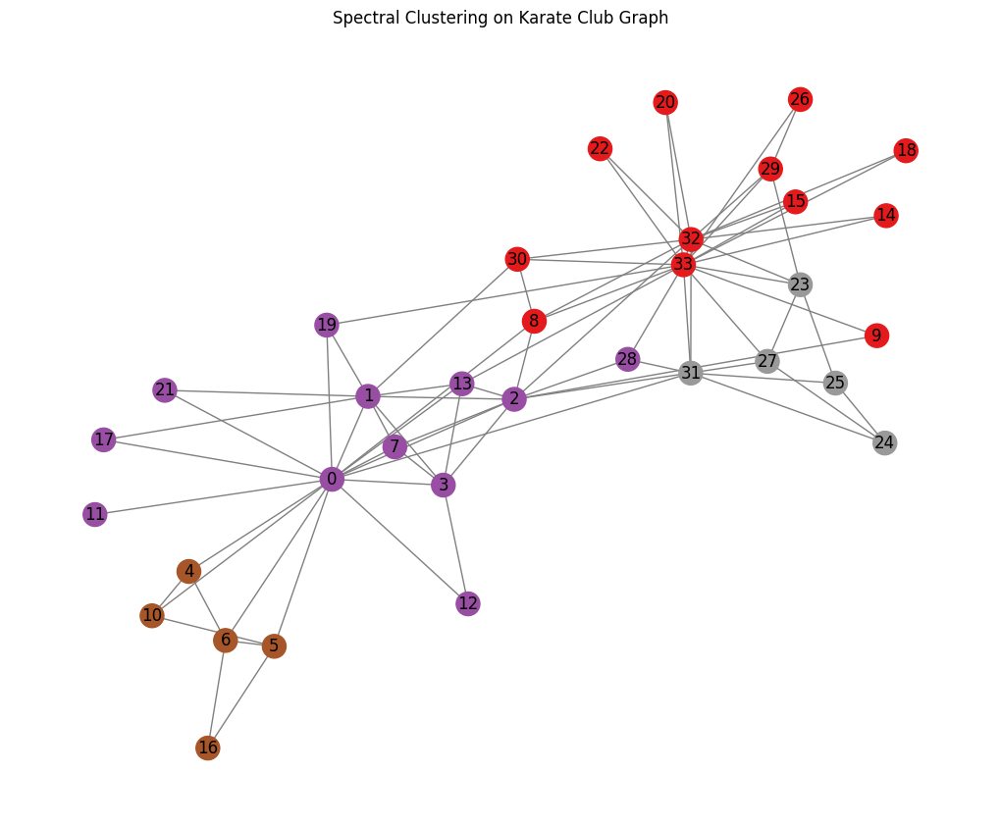

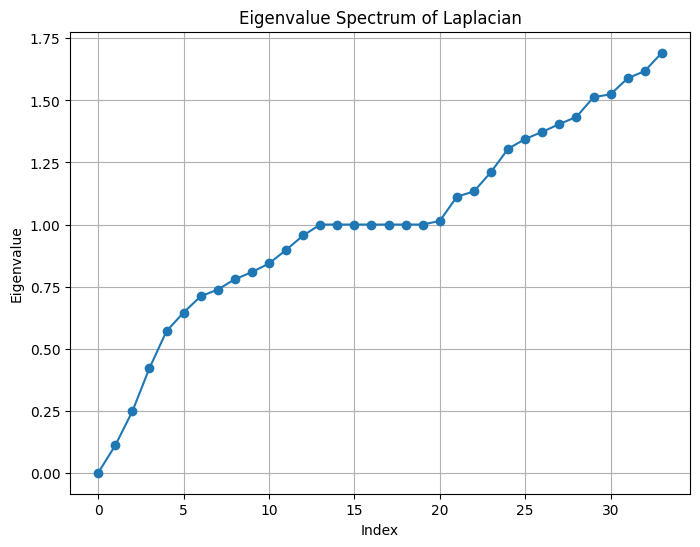

In [37]:
# Select the first k eigenvectors for k=4
k = 4
spectral_embedding = eigenvectors[:, :k]

# Apply k-means clustering on the spectral embedding
kmeans = KMeans(n_clusters=k, random_state=0).fit(spectral_embedding)
labels = kmeans.labels_

# Visualize the clusters on the graph
pos = nx.spring_layout(G)
plt.figure(figsize=(10, 8))
nx.draw(
    G, pos, node_color=labels, with_labels=True, cmap=plt.cm.Set1,
    node_size=300, edge_color="gray"
)
plt.title("Spectral Clustering on Karate Club Graph")
plt.show()

# Plot eigenvalue spectrum
plt.figure(figsize=(8, 6))
plt.plot(range(len(eigenvalues)), sorted(eigenvalues), marker='o')
plt.title("Eigenvalue Spectrum of Laplacian")
plt.xlabel("Index")
plt.ylabel("Eigenvalue")
plt.grid()
plt.show()


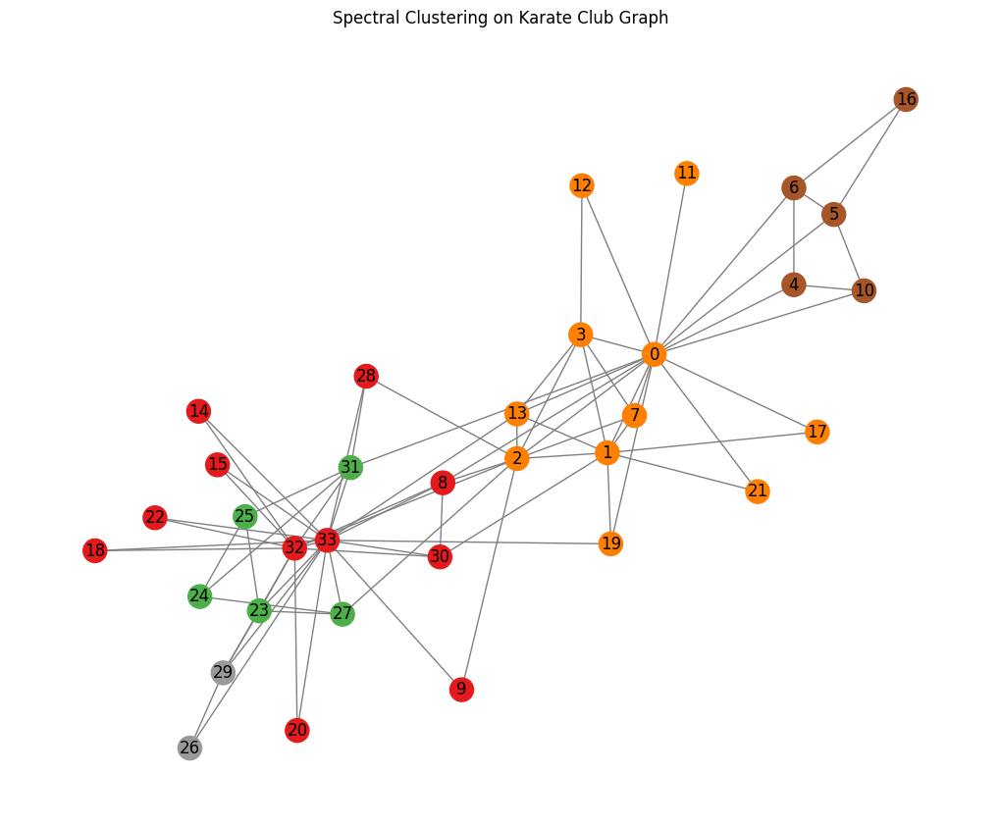

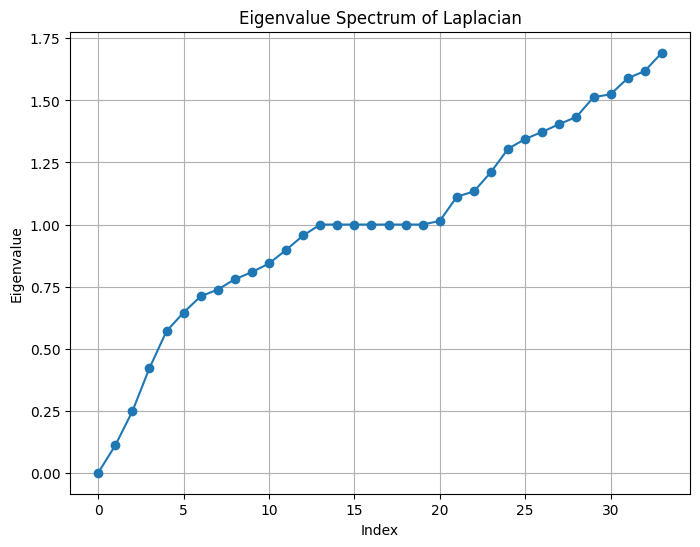

In [38]:
# Select the first k eigenvectors for k=5
k = 5
spectral_embedding = eigenvectors[:, :k]

# Apply k-means clustering on the spectral embedding
kmeans = KMeans(n_clusters=k, random_state=0).fit(spectral_embedding)
labels = kmeans.labels_

# Visualize the clusters on the graph
pos = nx.spring_layout(G)
plt.figure(figsize=(10, 8))
nx.draw(
    G, pos, node_color=labels, with_labels=True, cmap=plt.cm.Set1,
    node_size=300, edge_color="gray"
)
plt.title("Spectral Clustering on Karate Club Graph")
plt.show()

# Plot eigenvalue spectrum
plt.figure(figsize=(8, 6))
plt.plot(range(len(eigenvalues)), sorted(eigenvalues), marker='o')
plt.title("Eigenvalue Spectrum of Laplacian")
plt.xlabel("Index")
plt.ylabel("Eigenvalue")
plt.grid()
plt.show()


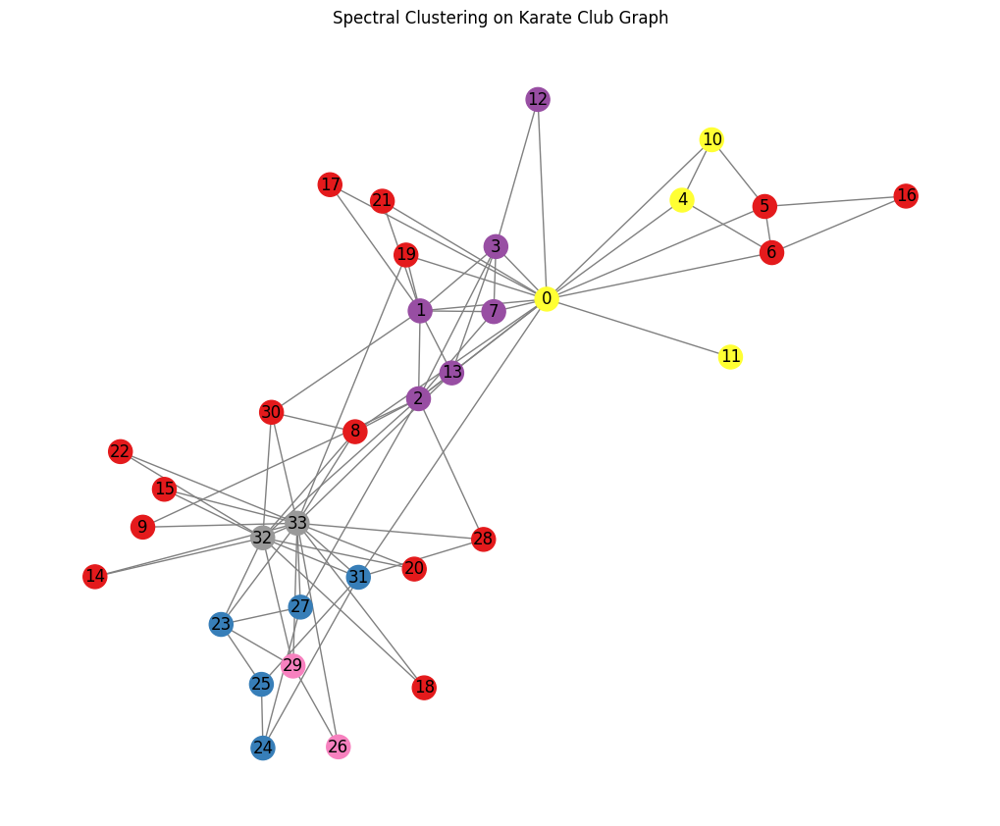

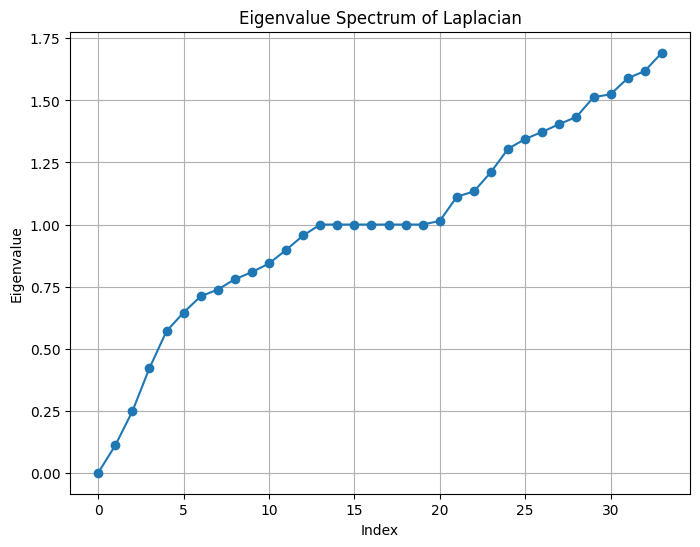

In [39]:
# Select the first k eigenvectors for k=3
k = 6
spectral_embedding = eigenvectors[:, :k]

# Apply k-means clustering on the spectral embedding
kmeans = KMeans(n_clusters=k, random_state=0).fit(spectral_embedding)
labels = kmeans.labels_

# Visualize the clusters on the graph
pos = nx.spring_layout(G)
plt.figure(figsize=(10, 8))
nx.draw(
    G, pos, node_color=labels, with_labels=True, cmap=plt.cm.Set1,
    node_size=300, edge_color="gray"
)
plt.title("Spectral Clustering on Karate Club Graph")
plt.show()

# Plot eigenvalue spectrum
plt.figure(figsize=(8, 6))
plt.plot(range(len(eigenvalues)), sorted(eigenvalues), marker='o')
plt.title("Eigenvalue Spectrum of Laplacian")
plt.xlabel("Index")
plt.ylabel("Eigenvalue")
plt.grid()
plt.show()
